In [1]:
import cv2
import numpy as np

from utils import plot_imgs
import os
import sys
module_path = os.path.abspath(os.path.join('..'))
if module_path not in sys.path:
    sys.path.append(module_path)
    
from superpoint.datasets.coco import Coco

%load_ext autoreload
%autoreload 2
%matplotlib inline

In [2]:
experiments = [
    'magic-point_coco-export1',
    'mp_coco-export_dist_aug',
    'mp_coco-export_dist_aug_2',
#    'mp_synth_hom-aug-100_coco',
#    'mp_synth_hom-dist-aug-100_coco',
#    'mp_synth-v6_photo-hom-aug_ha1-100-3-old_coco',
    
    
#    'mp_synth-v5_aug_reg-001_estop-60000_coco',
#    'mp_synth-v5_aug_reg-001_estop-60000_ha1-100-3_coco',
#    'mp_synth-v6_photo-hom-aug_ha1-100-3-old_coco',
#    'mp_synth-v6_photo-hom-aug_ha1-100-0-persp_coco',
#    'mp_synth-v5_aug_reg-001_estop-60000_ha1-1000-10_coco',
]
names = ['HAdaptation N=100', 'HDAdaptation N=100 It=1', 'HDAdaptation N=100 It=2'] #N: number of homographies, It: number of iterations

In [3]:
configs = [{'labels': 'outputs/{}'.format(e), 'truncate': 15} for e in experiments]
datasets = [Coco(**c).get_test_set() for c in configs]




Instructions for updating:
Use `tf.cast` instead.
Instructions for updating:
Use `tf.cast` instead.
Instructions for updating:
tf.py_func is deprecated in TF V2. Instead, there are two
    options available in V2.
    - tf.py_function takes a python function which manipulates tf eager
    tensors instead of numpy arrays. It's easy to convert a tf eager tensor to
    an ndarray (just call tensor.numpy()) but having access to eager tensors
    means `tf.py_function`s can use accelerators such as GPUs as well as
    being differentiable using a gradient tape.
    - tf.numpy_function maintains the semantics of the deprecated tf.py_func
    (it is not differentiable, and manipulates numpy arrays). It drops the
    stateful argument making all functions stateful.
    
Instructions for updating:
Use `for ... in dataset:` to iterate over a dataset. If using `tf.estimator`, return the `Dataset` object directly from your input function. As a last resort, you can use `tf.compat.v1.data.make_on

In [4]:
def draw_keypoints(img, corners, color=(0, 255, 0), radius=3, s=3):
    img = np.repeat(cv2.resize(img, None, fx=s, fy=s)[..., np.newaxis], 3, -1)
    for c in np.stack(corners).T:
        cv2.circle(img, tuple(s*np.flip(c, 0)), radius, color, thickness=-1)
    return img

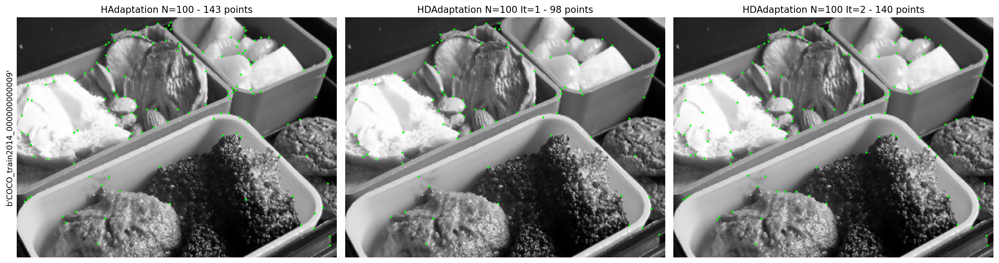

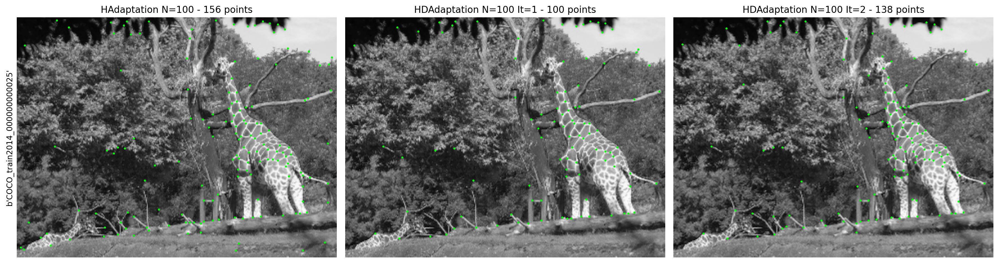

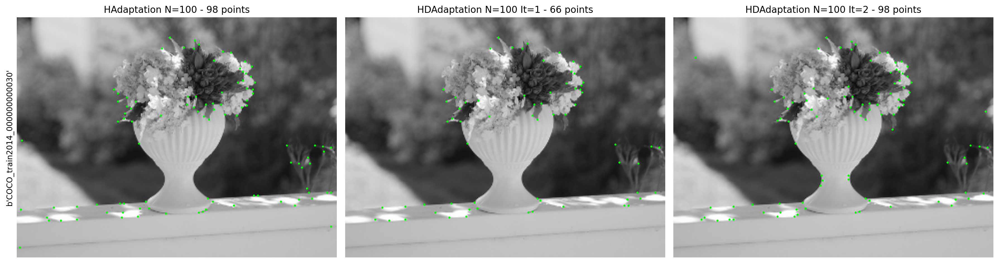

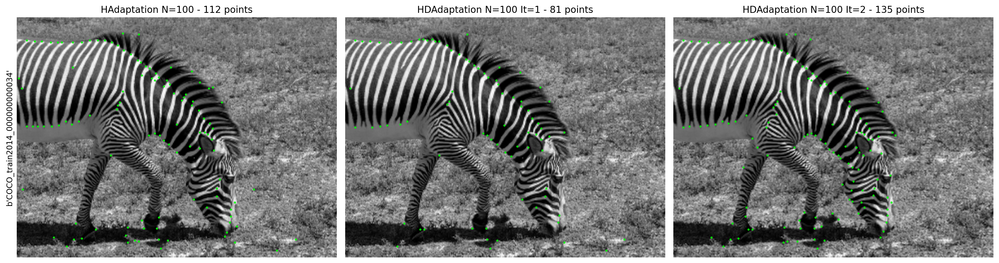

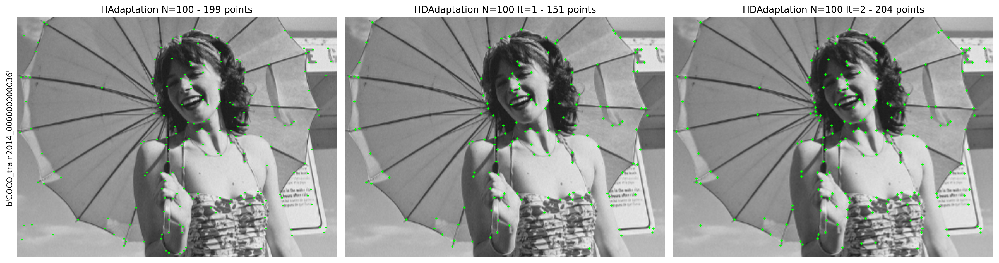

...

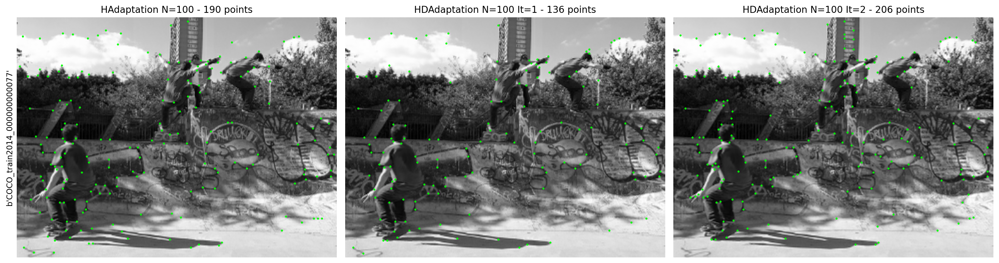

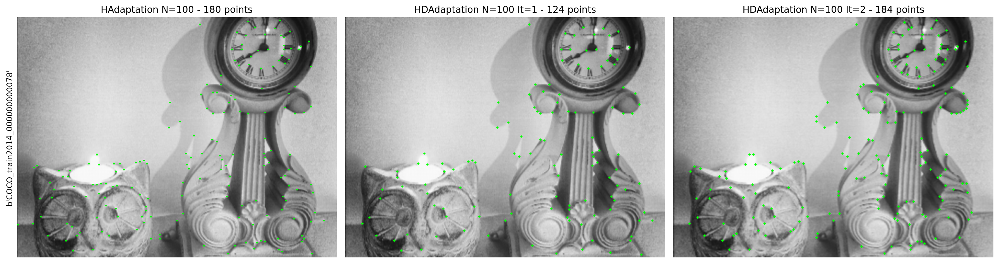

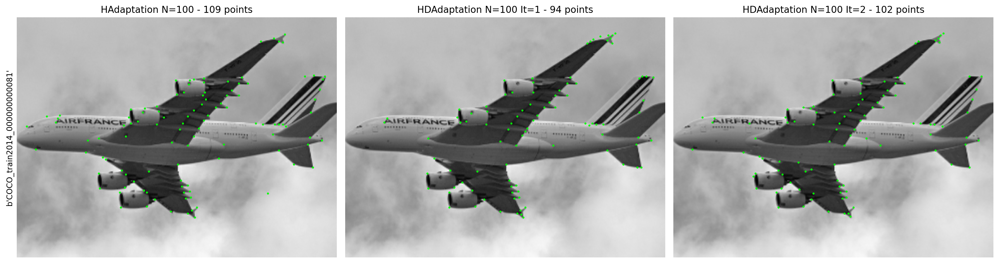

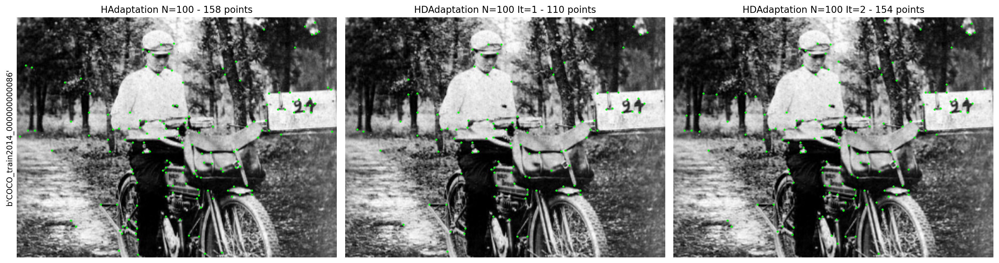

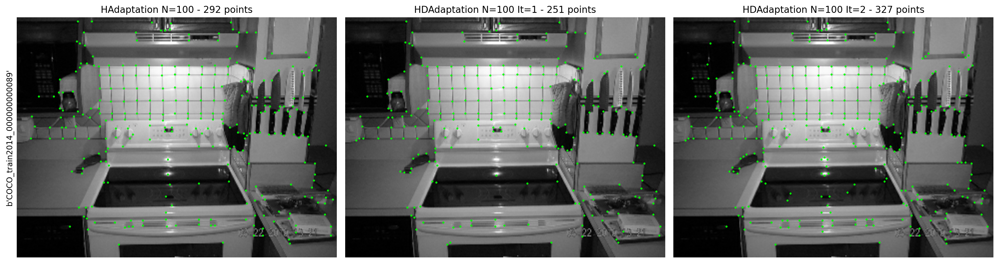

In [5]:
for i in range(15):
    images, titles = [], []
    for n, e, data in zip(names, experiments, datasets):
        d = next(data)
        images.append(draw_keypoints(d['image']*255, np.where(d['keypoint_map']))/255.)
        titles.append('{} - {} points'.format(n, len(d['keypoints'])))
    plot_imgs(images, titles=titles, ylabel=d['name'], dpi=200, cmap='gray')